<a href="https://colab.research.google.com/github/soniajoseph/ViT-Prisma/blob/main/demos/ViT_Prisma_Main_Demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import sys
sys.path.append('../src')

In [2]:
from vit_prisma.utils.data_utils import race_dict
from vit_prisma.utils import prisma_utils
from vit_prisma.prisma_tools.race_logit_lens import get_patch_logit_directions, get_patch_logit_dictionary

import numpy as np
import torch
from fancy_einsum import einsum
from collections import defaultdict
import pandas as pd
from scipy.stats import entropy

%matplotlib inline
import plotly.graph_objs as go
import plotly.express as px
from matplotlib import colors as mcolors
from matplotlib import pyplot as plt
from PIL import Image
from torchvision import transforms


from torchvision import transforms
from torch.utils.data import DataLoader
import torch

import datasets
from datasets import load_dataset, DatasetDict

import numpy as np
import random

from IPython.display import display, HTML

/root/paddlejob/workspace/env_run/luyanan05/fair-vit/venv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


**Helper Functions** (ignore)

In [3]:
def plot_image(image):
  plt.figure()
  plt.axis('off')
  plt.imshow(image.permute(1,2,0))

def plot_logit_boxplot(average_logits, labels):
  hovertexts = np.array([[RACE_DICT[i] for _ in range(25)] for i in range(3)])

  fig = go.Figure()
  data = []

  # if tensor, turn to numpy
  if isinstance(average_logits, torch.Tensor):
      average_logits = average_logits.detach().cpu().numpy()

  for i in range(average_logits.shape[1]):  # For each layer
      layer_logits = average_logits[:, i]
      hovertext = hovertexts[:, i]
      box = fig.add_trace(go.Box(
          y=layer_logits,
          name=f'{layer_labels[i]}',
          text=hovertext,
          hoverinfo='y+text',
          boxpoints='suspectedoutliers'
      ))
      data.append(box)


  means = np.mean(average_logits, axis=0)
  fig.add_trace(go.Scatter(
      x = layer_labels,
      y=means,
      mode='markers',
      name='Mean',
      # line=dict(color='gray'),
      marker=dict(size=4, color='red'),
  ))
  
  fig.update_layout(
    title='Raw Logit Values Per Layer (each dot is 1 ImageNet Class)',
    xaxis=dict(title='Layer'),
    yaxis=dict(title='Logit Values'),
    showlegend=False
    )
    
  fig.show()


def plot_patched_component(patched_head, title=''):
    """
    Use for plotting Activation Patching.
    """

    fig = go.Figure(data=go.Heatmap(
        z=patched_head.detach().numpy(),
        colorscale='RdBu',  # You can choose any colorscale
        colorbar=dict(title='Value'),  # Customize the color bar
        hoverongaps=False
    ))
    fig.update_layout(
        title=title,
        xaxis_title='Attention Head',
        yaxis_title='Patch Number',
    )

    return fig

def imshow(tensor, **kwargs):
    """
    Use for Activation Patching.
    """
    px.imshow(
          prisma_utils.to_numpy(tensor),
          color_continuous_midpoint=0.0,
          color_continuous_scale="RdBu",
          **kwargs,
      ).show()


### ViT Architecture

Unlike language models, vision transformers do not have a dictionary embedding and unembedding matrix. Instead, images are divided into non-overlapping patches, similar to tokens in language models. These patches are flattened and linearly projected to embeddings via a Conv2D layer, similar to word embeddings in language models. A learnable class token (CLS token) is appended to the beginning of the sequence, which accrues global information throughout the network. A linear position embedding is added to the patches.

The patch embeddings then pass through the transformer blocks (each block consists of a layer norm, an attention layer, another layernorm, and an mlp layer). The output of each block is added back to the previous input. The sum of the block and the previous input is called the residual stream.

The final layer of this vision transformer is a classification head with N logit values for N classes. The CLS token is fed into the final layer for N-way classification.

We use HookedViT to easily capture intermediate activations with custom hook functions, instead of dealing with PyTorch's normal hook functionality.

In [4]:
# We'll use a 32-patched vision transformer trained on CXR-Race dataset.
from vit_prisma.models.base_vit import HookedViT
# model = HookedViT.from_pretrained(model_name="Lancelottery/cxr-race-patch32", is_timm=False)
model = torch.load('../weight/healthy32-ac78/healthy_model.pth')

We can see above the specs of our model.

n_layers: 12, d_model: 768, d_head: 64, n_heads: 12 (per layer), d_mlp: 3072, patch_size: 32

### Data in Batches

helper functions:

In [5]:
class ConvertTo3Channels:
    def __call__(self, img):
        if img.mode != 'RGB':
            return img.convert('RGB')
        return img

transform = transforms.Compose([
    ConvertTo3Channels(),  # Ensure all images are 3-channel without turning them grayscale
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

def transform_batch(examples):
    images = [transform(image) for image in examples['image']]
    label_map = {'WHITE': 0, 'BLACK/AFRICAN AMERICAN': 1, 'ASIAN':2}  
    labels = [label_map[race] for race in examples['race']]
    labels = torch.tensor(labels, dtype=torch.long) 

    return {'image': images, 'label': labels}

def get_attn_across_datapoints(attn_head_idx, attention_type="attn_scores"):

  list_of_attn_heads = [attn_head_idx]

  # Retrieve the activations from each batch idx
  all_patterns = []
  for batch_idx in range(images.shape[0]):
    patterns = visualize_attention(list_of_attn_heads, cache, "Attention Scores", 700, batch_idx = batch_idx, attention_type=attention_type)
    all_patterns.extend(patterns)
  all_patterns = torch.stack(all_patterns, dim=0)
  return all_patterns

# Set global seeds
def set_seed(seed_value):
    torch.manual_seed(seed_value)
    torch.cuda.manual_seed(seed_value)
    torch.cuda.manual_seed_all(seed_value)  # if you are using multi-GPU.
    np.random.seed(seed_value)  # Numpy module.
    random.seed(seed_value)  # Python random module.
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True

seed_value = 42
set_seed(seed_value)

# Define a worker init function that sets the seed
def worker_init_fn(worker_id):
    worker_seed = torch.initial_seed() % 2**32
    np.random.seed(worker_seed)
    random.seed(worker_seed)

# Display a few images
def show_images(images, labels):
    fig, axes = plt.subplots(1, len(images), figsize=(12, 3 * len(images)))  # Adjusted subplot size
    if len(images) == 1:  
        axes = [axes]
    for img, label, ax in zip(images, labels, axes):
        # Reverse the normalization
        mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
        std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
        img = img * std + mean  # Apply reverse normalization
        img = img.permute(1, 2, 0)  # Reorder dimensions for displaying
        img = img.clamp(0, 1)  # Clamp the values to [0, 1] to avoid warnings
        ax.imshow(img)
        label_map = {0: 'WHITE', 1: 'BLACK', 2: 'ASIAN'}
        label_str = label_map.get(label.item(), 'Unknown')
        ax.set_title(f'Label: {label_str}')
        ax.axis('off')  
    plt.tight_layout()
    plt.show()

In [6]:
batch_size = 16
white_dataset = DatasetDict.load_from_disk("/content/drive/MyDrive/healthy_test_white")
white_dataset.set_transform(transform_batch)
test_loader = DataLoader(white_dataset['test'], batch_size=batch_size, shuffle=True, num_workers=2, worker_init_fn=worker_init_fn)

Batch dimension:  torch.Size([16, 3, 224, 224])


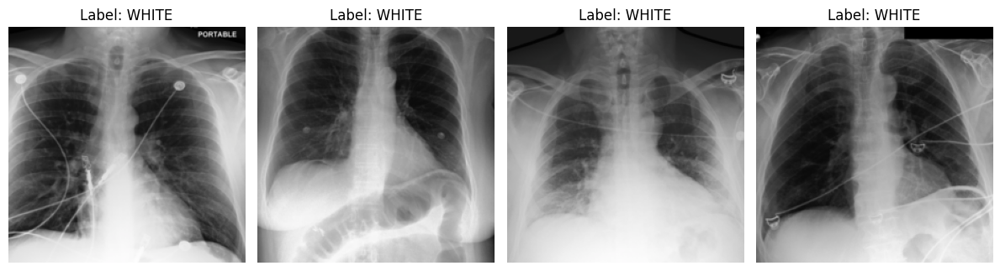

In [7]:
data = next(iter(test_loader))
images, labels = data['image'], data['label']
print("Batch dimension: ",images.shape)
show_images(images[:4], labels[:4])

We divide our 224 x 224 image into 32 x 32 non-overlapping patches to feed into the transformer. The transformer also appends a CLS token at the beginning, which is not represented spatially. In total, including the CLS token, there are 50 patches for the image.


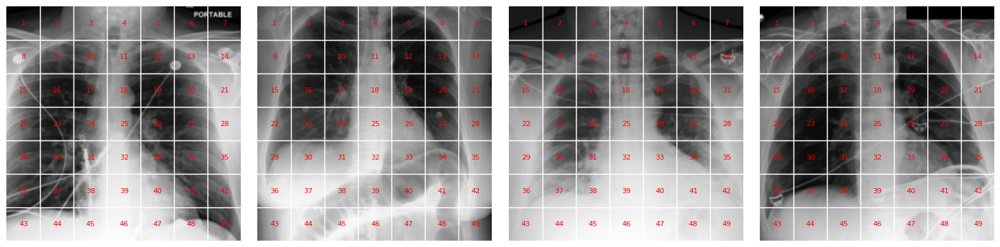

In [8]:
from vit_prisma.visualization.visualize_image import display_grid_on_images
display_grid_on_images(images, 4, patch_size=32)

### Test prompt

Let's feed the images into the transformer and investigate its top logits.

In [9]:
from vit_prisma.utils.data_utils.race_utils import race_index_from_word
from vit_prisma.utils.data_utils.race_dict import RACE_DICT
from vit_prisma.utils.prisma_utils import test_prompt

label_map = {0: 'WHITE', 1: 'BLACK/AFRICAN AMERICAN', 2: 'ASIAN'}
for i in random.sample(range(16), 4):
# for i in range(16):
    label_str = label_map.get(labels[i].item(), 'Unknown')
    print("Ground truth: ", label_str)
    test_prompt(images[i],model)
    print(" ")

Ground truth:  WHITE
Top 0th token. Logit: 1.93 Prob: 90.32% Label: |WHITE|
Top 1th token. Logit: -0.61 Prob: 7.10% Label: |ASIAN|
Top 2th token. Logit: -1.62 Prob: 2.59% Label: |BLACK/AFRICAN AMERICAN|
 
Ground truth:  WHITE
Top 0th token. Logit: 2.15 Prob: 92.78% Label: |WHITE|
Top 1th token. Logit: -0.72 Prob: 5.30% Label: |ASIAN|
Top 2th token. Logit: -1.73 Prob: 1.92% Label: |BLACK/AFRICAN AMERICAN|
 
Ground truth:  WHITE
Top 0th token. Logit: 1.87 Prob: 90.92% Label: |WHITE|
Top 1th token. Logit: -0.90 Prob: 5.68% Label: |ASIAN|
Top 2th token. Logit: -1.41 Prob: 3.40% Label: |BLACK/AFRICAN AMERICAN|
 
Ground truth:  WHITE
Top 0th token. Logit: 0.32 Prob: 43.74% Label: |BLACK/AFRICAN AMERICAN|
Top 1th token. Logit: 0.13 Prob: 36.13% Label: |WHITE|
Top 2th token. Logit: -0.45 Prob: 20.13% Label: |ASIAN|
 


Let's run the model again and cache all the intermediate activations.

In [10]:
# Run Cache
output, batch_cache = model.run_with_cache(images)

# Logit Attribution

We want to see how each internal component of the model is impacting its output. Direct logit attribution is a powerful technique to do so.

<details> <summary>Background</summary>

Compared to past architectures like CNNs and RNNs, transformers are unusually interpretable. This is partially because transformers are highly linear, which means we can easily decompose the output of each layer into the contributions of its previous parts.

The residual stream of the transformer is the cumulative sum of the outputs of the previous layers, plus the original patch and position embedding.

The output of each attention layer can be decomposed into a sum of the attention heads; and the output of each MLP layer can be decomposed into the sum of each neuron.

The final logits of the model are `logits=ClassificationHead(LayerNorm(final_residual_stream)`. The classification head is a linear layer, and the LayerNorm is *approximately* a linear layer. Thus, we can decompose the logits into the sum of components, and see which components contribute most to the logit of the correct answer.

For example, the tabby cat logit has an index of 281 in our 1000-logit classification head. We can decompose the transformer to see which components of the transformer (MLP layers, attention heads, etc) contribute most strongly to the tabby cat logit.

For details on the linear structure of transformer, check out [A Mathematical Framework for Transformer Circuits](https://transformer-circuits.pub/2021/framework/index.html).

For more details on direct logit attribution, check out the mech interp explainer [here](https://dynalist.io/d/n2ZWtnoYHrU1s4vnFSAQ519J#z=disz2gTx-jooAcR0a5r8e7LZ) and the original Exploratory Analysis notebook [here](https://colab.research.google.com/github/neelnanda-io/TransformerLens/blob/main/demos/Exploratory_Analysis_Demo.ipynb#scrollTo=tGz70kpdiPzs).

<details> <summary> Folding LayerNorm </summary>

The original LayerNorm implementation, which is a center and scale, messes with the linearity described above. The LayerNorm is almost a linear operation except for the scaling factor; but thankfully, if we fix the scale factor, then it becomes a global property. Thus, we can create an approximation of the LayerNorm that factors out the linear parts with 'fold_ln' when we load the model, and we can move the scaling factor to the end of the residual stream as a global computation with 'apply_ln'.
For more information, check out the [original rationale](https://github.com/neelnanda-io/TransformerLens/blob/main/further_comments.md) on TransformerLens.
</details>



In [11]:
## Accumulated residual
white_index = race_index_from_word("WHITE")
black_index = race_index_from_word("BLACK/AFRICAN AMERICAN")

print("White index:", white_index)
print("Black index: ", black_index)

White index: 0
Black index:  1


We want to compare the logits between WHITE and BLACK.

Let's get the residual directions of these two classes.

The residual directions are simply indexing into the classication head, which is represented as a 768 x 3 matrix. We take the columns that correspond with the WHITE and BLACK indices. We're taking these size 768 vectors as our residual directions.

In [12]:
white_answer_residual_direction = model.tokens_to_residual_directions(white_index)
print("Size of White residual direction", white_answer_residual_direction.shape)

black_answer_residual_direction = model.tokens_to_residual_directions(black_index)
print("Size of Black residual direction", black_answer_residual_direction.shape)

Size of White residual direction torch.Size([768])
Size of Black residual direction torch.Size([768])


To check that our residual directions are correct, we can dot product them with the model's final residual stream. The answer should equal the raw logit value if we indexed directly into the model's output logits.

In [13]:
# Confirm manually
final_residual_stream = batch_cache["resid_post", -1]

# Put 0 to get CLS token at beginning
cls_token_residual_stream = final_residual_stream[:, 0, :]

scaled_final_token_residual_stream = batch_cache.apply_ln_to_stack(cls_token_residual_stream, layer=-1, pos_slice=0 )

white_logit = einsum(
    "batch d_model, d_model -> batch",
    scaled_final_token_residual_stream,
    white_answer_residual_direction,
)

black_logit = einsum(
    "batch d_model, d_model -> batch",
    scaled_final_token_residual_stream,
    black_answer_residual_direction,
)

white_logit = white_logit + model.head.b_H[white_index] # Add bias of head
print("White logit shape: ", white_logit.shape)
print("Calculated white logit value:", round(white_logit.mean().item(), 3))
print("White logit value taken directly from model's output logits:", round(output[:,white_index].mean().item(),3))
print()

black_logit = black_logit + model.head.b_H[black_index]
print("Black logit shape: ", black_logit.shape)
print("Calculated Black logit value:", round(black_logit.mean().item(), 3))
print("Black logit value taken directly from model's output logits:", round(output[:,black_index].mean().item(), 3))

White logit shape:  torch.Size([16])
Calculated white logit value: 1.394
White logit value taken directly from model's output logits: 1.394

Black logit shape:  torch.Size([16])
Calculated Black logit value: -1.062
Black logit value taken directly from model's output logits: -1.062


## All Logit Values

We can project every intermediate CLS token output from each layer onto the residual directions. This is the equivalent of directly feeding the CLS output of each layer into the 3-way classification head to get a logit value for each class.

In [14]:
#Computes the average logit value across all classes in batch for a given residual stack.
def average_logit_value_across_all_classes(
    residual_stack,
    cache,
    mean = True,
):
    scaled_residual_stack = cache.apply_ln_to_stack(
            residual_stack, layer=-1, pos_slice=0
        )

    # Average across all batches
    average_scaled_residual_stack = scaled_residual_stack.mean(dim=1, keepdim=True)

    all_residual_directions = model.tokens_to_residual_directions(np.arange(3)) # Get all residual directions

    logit_predictions = einsum(
        "layer batch d_model, batch d_model -> batch layer",
        average_scaled_residual_stack,
        all_residual_directions,
    )
    if mean:
      logit_predictions = logit_predictions.mean(axis=0)

    return logit_predictions

accumulated_residual, layer_labels = batch_cache.accumulated_resid(
    layer=-1, incl_mid=True, pos_slice=0, return_labels=True)

average_logits = average_logit_value_across_all_classes(accumulated_residual, batch_cache, mean=False)

print(f"average_logits shape: {average_logits.shape}") 

average_logits shape: torch.Size([3, 25])



We can see that the final attention layer most significantly changes the distribution of logits! The plot is interactive; hover your mouse over the outliers to see the class names.z

**Key for graph below**
* n_pre - residual stream at start of layer n
* n_mid - residual stream after attention part of layer
* final_post - residual stream after final mlp layer (before classification head)

<details>
<summary><i>Note on raw logit metric for more experienced mech interp people</i></summary>

The logit difference between two classes, rather than the raw logit value itself, is often considered a more reliable measure. This is because when subtracting one logit from another, any arbitrary constants inherent in the logits cancel out. The design of cross-entropy loss focuses specifically on the differences between class logits, which can result in the logits being adjusted by an arbitrary constant. For a more in-depth explanation, refer to the mechanism interpretation explainer [here](https://dynalist.io/d/n2ZWtnoYHrU1s4vnFSAQ519J#z=disz2gTx-jooAcR0a5r8e7LZ) or the original Exploratory Analysis notebook [here](https://colab.research.google.com/github/neelnanda-io/TransformerLens/blob/main/demos/Exploratory_Analysis_Demo.ipynb#scrollTo=tGz70kpdiPzs).

Contrary to the initial Indirect Object Identification (IOI) analysis, which focuses on the logit differences between two classes, my approach considers the raw logit value of a single class. Observing a box plot of all logit values reveals that, on average, the values are near zero for every layer (indicated by the red dot). Therefore, the notion of biases neutralizing each other, as seen in the logit difference case, does not hold here since the average logit value is zero.




</details>



In [15]:
plot_logit_boxplot(average_logits, layer_labels)

### Layer-Level Logit lens
We'll now project every layer of the image's residual stream onto the residual directions. We'll use just the CLS token for this analysis.

This is analogous to deleting all subsequent layers and just projecting that layer's output into the classification head. This will tell us the likelihood the net assigns to each class throughout the net.

Let's also grab a random logit, like banana, for comparison. We'll also get the average of all logits as a baseline.

In [16]:
misc_residual_direction = model.tokens_to_residual_directions(2)
print("Asian index:", 2)

Asian index: 2



Let's plot the logit values for WHITE, BLACK, and ASIAN throughout the layers.

In [17]:
accumulated_residual, layer_labels = batch_cache.accumulated_resid(
        layer=-1, incl_mid=True, pos_slice=0, return_labels=True
)
print("Size of accumulated_residual", accumulated_residual.shape)

Size of accumulated_residual torch.Size([25, 16, 768])


In [18]:
def residual_stack_to_logit(
    residual_stack,
    cache,
    answer_residual_directions
):
    scaled_residual_stack = cache.apply_ln_to_stack(
        residual_stack, layer=-1, pos_slice=0
    )
    average_scaled_residual_stack = scaled_residual_stack.mean(dim=1, keepdim=True)

    logit_predictions = torch.einsum(
        "l b d, d -> l",
        average_scaled_residual_stack,
        answer_residual_directions,
    )
    return logit_predictions

The plot below is interactive. Run your cursor over the layers to see the corresponding logit value.

In [19]:
fig = go.Figure()

residual_directions = [
    (white_answer_residual_direction, 'White Logit', model.head.b_H[0], 'dark blue'), # blue for white
    (black_answer_residual_direction, 'Black Logit', model.head.b_H[1], 'black'), 
    (misc_residual_direction, 'Asian (non-relevant) Logit', model.head.b_H[2], 'yellow'), 
]

hover_text = [f"{layer_labels[idx]}" for idx, diff in enumerate(accumulated_residual)]

# Process each residual direction
for direction, label, bias, color in residual_directions:
    logit_predictions = residual_stack_to_logit(accumulated_residual, batch_cache, direction)
    logit_predictions = logit_predictions.T + bias  # Add bias
    logit_predictions = logit_predictions.detach().numpy()
    fig.add_trace(go.Scatter(x= np.arange(model.cfg.n_layers * 2 + 1) / 2, y=logit_predictions, mode='lines', name=label, text=hover_text, line=dict(color=color)))

# Handle "Average Logit Across All Classes" separately
average_total_logits = average_logit_value_across_all_classes(accumulated_residual, batch_cache).detach().numpy()
fig.add_trace(go.Scatter(x= np.arange(model.cfg.n_layers * 2 + 1) / 2, y=average_total_logits, mode='lines', name='Average Logit Across All Classes'))

fig.update_layout(
    title="Logit through Model Layers",
    xaxis_title="Model Layer",
    yaxis_title="Logit Value",
)

fig.show()


/tmp/ipykernel_91301/1507622036.py:14: UserWarning:

The use of `x.T` on tensors of dimension other than 2 to reverse their shape is deprecated and it will throw an error in a future release. Consider `x.mT` to transpose batches of matrices or `x.permute(*torch.arange(x.ndim - 1, -1, -1))` to reverse the dimensions of a tensor. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3571.)



We can see the model doesn't really weight the WHITE prediction too highly until Layer 10! The prediction is around equal to the ASIAN prediction. Interestingly, it takes until Layer 11 for the model to decide that the image is *not* an ASIAN.

We can do the same analysis above, but for each layer. This is equivalent to taking the difference between each adjacent residual stream.

We can see that the final attention layer does the most work in deciding the computation. The subsequent MLP layer actually makes its performance worse!

The last two layers seem to being the bulk of the work in identifying the WHITE and the BLACK.

## Patch-level logit lens

We ran the analysis above on just the CLS token of the model. But we actually have 49 other patches that we haven't investigated yet.

(As a reminder, our 224 x 224 image was divided into 50 non-overlapping patches. Each patch is 32 x 32. The patches are analogous to tokens in an LLM.)

The attention layers move information between patches, while the MLP layers process information within each patch. One open question in vision mech interp is what each patch represents throughout the net, and how information moves between the patches. How is information "gathered" across a cat whisker, cat ear, and cat eye to lead to a cat classification? Does every patch contain local information from the original image, even in the last layers of the net? For instance, does a patch initially containing a dog ear retain dog ear information, even after 12 layers of global self-attention? Or does it start storing higher abstractions, such as, dog face information, and dog breed information?

A patch-level logit lens is a good starting point to investigate these questions. The patch-level logit lens is the same as the analysis done above, but run on every patch instead of just the CLS token.

We'll soon see that each patch encodes information (mostly) locally, to the extent that we can use the patch-level logit lens as a segmentation map.

In [20]:
from vit_prisma.prisma_tools.race_logit_lens import get_patch_logit_directions, get_patch_logit_dictionary

all_answers = model.tokens_to_residual_directions(np.arange(3))
patch_logit_directions = get_patch_logit_directions(batch_cache, all_answers, incl_mid=True)
print("patch_logit_directions shape: ",patch_logit_directions[0].shape)

patch_dictionary = get_patch_logit_dictionary(patch_logit_directions, rank_label='white')
print("Length of patch dictionary:", len(patch_dictionary)) # Number of patches
print("Length of one dictionary entry:", len(list(patch_dictionary.values())[0])) # Layers

white_rank_formatted = np.array([[item[-1] for item in list(patch_dictionary.values())[i]] for i in range(50)])

patch_dictionary = get_patch_logit_dictionary(patch_logit_directions, rank_label='black')
black_rank_formatted = np.array([[item[-1] for item in list(patch_dictionary.values())[i]] for i in range(50)])

patch_dictionary = get_patch_logit_dictionary(patch_logit_directions, rank_label='asian')
asian_rank_formatted = np.array([[item[-1] for item in list(patch_dictionary.values())[i]] for i in range(50)])


patch_logit_directions shape:  torch.Size([16, 50, 25, 3])
Length of patch dictionary: 50
Length of one dictionary entry: 25


We'll see how highly each layer ranks WHITE and BLACK in its predictions to get a rank for each class.

In [21]:
import plotly.graph_objs as go
import numpy as np

# Initialize traces list for Plotly
traces = []

# Define colors with darker shades
colors = {
    'white': {'cls_color': 'rgba(0, 0, 255, 1.0)', 'patch_color': 'rgba(169, 169, 169, 0.5)'},
    'black': {'cls_color': 'rgba(255, 0, 0, 1.0)', 'patch_color': 'rgba(218, 165, 32, 0.5)'},
}

# Data setup for each class
data_classes = [
    {'name': 'white', 'data': white_rank_formatted},
    {'name': 'black', 'data': black_rank_formatted},
]

# Processing both classes in a single loop
for class_info in data_classes:
    rank_data = class_info['data']
    class_name = class_info['name']
    cls_color = colors[class_name]['cls_color']
    patch_color = colors[class_name]['patch_color']

    for i, patch_data in enumerate(rank_data):
        color = cls_color if i == 0 else patch_color
        width = 2 if i == 0 else 1
        mode = 'lines+markers' if i == 0 else 'lines'
        trace = go.Scatter(
            x=np.arange(len(patch_data) * 2 + 1) / 2,
            y=patch_data,
            mode=mode,
            line=dict(color=color, width=width),
            hoverinfo='text',
            text=[f'Layer {x + 1}, Patch {i} - {class_name.capitalize()}, Rank: {y}' for x, y in enumerate(patch_data)],
            name=f'{class_name.capitalize()} Rank for CLS' if i == 0 else f'{class_name.capitalize()} Rank',
            showlegend=i < 2  # Show legend only for the first CLS and patch
        )
        traces.append(trace)

# Plotting configuration
fig = go.Figure(traces)
fig.update_layout(
    title='Patch Ranks Over Layers for White and Black',
    xaxis_title='Layer',
    yaxis_title='Rank',
    hovermode='closest',
    legend_title='Legend',
    legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01)
)
fig.show()


Above, we've done a logit lens on every individual patch. We've plotted each layer's ranking for the WHITE and BLACK classes.

The patch info appears to have a decent amount of spatial localization. The patches for which both cat/collie rank poorly (patches 15, 21, 7, 35) correspond to the edges of the image. Patch 25 ranks poorly for tabby, but well for dog, which spatially corresponds to the dog.

It's interesting that the rank for the cat and collie somewhat trade off against each other in the middle of the net (Layers 4-7).

As a sanity check, let's graph the rank of the CLS token alongside its logit value.

In [22]:
# Graph CLS rank and logit together
import plotly.graph_objects as go
from plotly.subplots import make_subplots

cls_token = white_rank_formatted[0]

# Create a figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add rank plot
fig.add_trace(
    go.Scatter(x=list(range(len(cls_token))), y=cls_token, name="Rank of white (CLS token)", mode='lines+markers'),
    secondary_y=False,
)

# Get cat residual direction independently
white_logit_predictions = residual_stack_to_logit(accumulated_residual, batch_cache, white_answer_residual_direction)
white_logit_predictions = white_logit_predictions.T + bias  # Add bias
white_logit_predictions = white_logit_predictions.detach().numpy()


# Add logit difference plot
fig.add_trace(
    go.Scatter(x=list(range(len(white_logit_predictions))), y=white_logit_predictions, name="Logit diff", mode='lines+markers'),
    secondary_y=True,
)


# Add figure title
fig.update_layout(
    title_text="Rank of White and Logit Differences Through Model Layers"
)

# Set x-axis title
fig.update_xaxes(title_text="Model Layers")
fig.update_yaxes(title_text="<b>Rank</b> of WHITE", secondary_y=False)
fig.update_yaxes(title_text="<b>Logit Difference</b>", secondary_y=True)

fig.show()


### Emoji logit lens
It'd be nice to have a clearer visual representation of what is happening. Let's get the predicted value for each patch for every layer of the net. This is equivalent to passing every layer's output into the classification head and seeing the prediction.

Hover over the emoji logit lens below to see the class name.

In [23]:
from vit_prisma.utils.data_utils.race_emoji import RACE_EMOJI
from vit_prisma.visualization.race_patch_level_logit_lens import display_patch_logit_lens
# Randomly ick one image from the bath of 16
batch_idx = random.randint(0, len(images) - 1)
# batch_idx = 3
print(f"Batch index: {batch_idx}")
patch_logit_directions = get_patch_logit_directions(batch_cache, all_answers, incl_mid=False)
patch_dictionary = get_patch_logit_dictionary(patch_logit_directions, batch_idx=batch_idx)
display_patch_logit_lens(patch_dictionary, labels=layer_labels[::2], width=1300, height=1000, emoji_size=15)

Batch index: 7


### WHITE/ BLACK patch-level map

We can overlay the final layer predictions of the patch-level logit lens on top of the original image.

Also, some patches (yellow) seem to contribute more to the logits than others. Perhaps these patches have more predictive "white" or "black" information.

As for the random-seeming predictions like "aircraft carrier" on patch 7; it's not clear why the net is predicting this. Reverse-engineering why it predicts aircraft carrier is a satisfying future research direction.

In [24]:
from vit_prisma.visualization.race_patch_level_logit_lens import display_grid_on_image_with_heatmap

def get_image_from_batch(images,labels,idx):
    image = images[idx]
    label = labels[idx]
    label_map = {0: 'WHITE', 1: 'BLACK/AFRICAN AMERICAN', 2: 'ASIAN'}
    label_str = label_map.get(label.item(), 'Unknown')
    print("Ground truth: ", label_str)
    
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    image = image * std + mean  # Apply reverse normalization
    image = image.permute(1, 2, 0)  # Reorder dimensions for displaying
    image = image.clamp(0, 1)  # Clamp the values to [0, 1] to avoid warnings
    return image

# Display heatmap 
image = get_image_from_batch(images, labels, 10)
test_prompt(images[batch_idx],model)
fig = display_grid_on_image_with_heatmap(image.numpy(), patch_dictionary, alpha_color=.4, emoji_font_size=10, return_graph=True)
fig.show()


Ground truth:  WHITE
Top 0th token. Logit: 2.12 Prob: 92.42% Label: |WHITE|
Top 1th token. Logit: -0.77 Prob: 5.13% Label: |BLACK/AFRICAN AMERICAN|
Top 2th token. Logit: -1.51 Prob: 2.45% Label: |ASIAN|


The segmentation map becomes even more pronounced if we group all the dogs together and all the cats together and color-code by logit value.

In [25]:
fig = display_grid_on_image_with_heatmap(image.numpy(), patch_dictionary, heatmap_mode='emoji_colors',emoji_alpha=.7, emoji_font_size=10,  return_graph=True, alpha_color=.4, layer_idx=-1)
fig.show()

It's interesting that the model still predict cat despite there being more dog patches and more dog classes!

It is fascinating that the model predicts Border collie even for the blank patches on the right.

# The Cat - Dog Switch

I'm curious why the network predicts WHITE over BLACK. Can we localize the point in the network that makes this "decision"?

Let's take the *logit difference* between the WHITE and BLACK predictions as our new metric.

***Is it possible to switch the network's prediction from white to black?***

In [26]:
def logits_to_ave_logit_diff(logits, answer_tokens, per_prompt=False):
    # Extract relevant logits
    answer_logits = logits[:, answer_tokens[0]]
    
    # Apply logsumexp separately for each class across the batch dimension
    logit_class1 = torch.logsumexp(answer_logits[:, 0:1], dim=-1)  # logsumexp for first class
    logit_class2 = torch.logsumexp(answer_logits[:, 1:2], dim=-1)  # logsumexp for second class
    
    # Calculate the logit difference
    answer_logit_diff = logit_class1 - logit_class2
    
    if per_prompt:
        return answer_logit_diff
    else:
        return answer_logit_diff.mean()

# Example for batch of images
white_index = 0
black_index = 1
logits = torch.randn(16, 3)  # Batch of 16 data points
answer_tokens = [[white_index, black_index]]
answer_tokens = torch.Tensor(answer_tokens).long()

# Set per_prompt to True to get logit differences for each element in the batch
logit_diff = logits_to_ave_logit_diff(output, answer_tokens, per_prompt=True)
formatted_logit_diff = ", ".join(f"{diff:.4f}" for diff in logit_diff)
print(f"The logit differences between White and Black for each prompt are: [{formatted_logit_diff}]")

# Set per_prompt to False to get the average logit difference across the batch
logit_diff_avg = logits_to_ave_logit_diff(output, answer_tokens, per_prompt=False)
print(f"The average logit difference between White and Black is: {logit_diff_avg.item():.4f}")


The logit differences between White and Black for each prompt are: [3.8782, 1.7220, 0.4994, 3.5524, -0.1910, 3.5419, 1.3255, 2.8913, 1.6015, 3.2989, 3.5763, 3.2860, 3.0724, 3.2811, 1.9023, 2.0665]
The average logit difference between White and Black is: 2.4565


In [27]:
import math

def interpret_logit_diff(logit_diff):
    interpretations = []
    for diff in logit_diff:
        odds_ratio = torch.exp(diff).item()
        inverse_odds_ratio = 1 / odds_ratio
        
        if diff > 0:
            interpretation = (f"Logit difference: {diff:.4f} - "
                              f"The model is {odds_ratio:.2f} times more likely to pick White than Black")
        else:
            interpretation = (f"Logit difference: {diff:.4f} - "
                              f"The model is {odds_ratio:.2f} times more likely to pick Black than White")
        interpretations.append(interpretation)
    return interpretations

interpretations = interpret_logit_diff(logit_diff)
for interp in interpretations:
    print(interp)


avg_odds_ratio = torch.exp(logit_diff_avg).item()
inverse_avg_odds_ratio = 1 / avg_odds_ratio
print(f"The average logit difference between White and Black is: {logit_diff_avg.item():.4f}")
print(f"This means the model is {avg_odds_ratio:.2f} times more likely to pick White than Black")

Logit difference: 3.8782 - The model is 48.34 times more likely to pick White than Black
Logit difference: 1.7220 - The model is 5.60 times more likely to pick White than Black
Logit difference: 0.4994 - The model is 1.65 times more likely to pick White than Black
Logit difference: 3.5524 - The model is 34.90 times more likely to pick White than Black
Logit difference: -0.1910 - The model is 0.83 times more likely to pick Black than White
Logit difference: 3.5419 - The model is 34.53 times more likely to pick White than Black
Logit difference: 1.3255 - The model is 3.76 times more likely to pick White than Black
Logit difference: 2.8913 - The model is 18.02 times more likely to pick White than Black
Logit difference: 1.6015 - The model is 4.96 times more likely to pick White than Black
Logit difference: 3.2989 - The model is 27.08 times more likely to pick White than Black
Logit difference: 3.5763 - The model is 35.74 times more likely to pick White than Black
Logit difference: 3.2860 


We can graph out the logit difference through the layers below:

In [28]:
# Calculate logit difference directions for the batch
answer_residual_directions = model.tokens_to_residual_directions(answer_tokens)
logit_diff_directions = answer_residual_directions[:, 0] - answer_residual_directions[:, 1]
print("Logit difference directions shape:", logit_diff_directions.shape)

# Ensure logit_diff_directions is the correct shape
logit_diff_directions = logit_diff_directions.squeeze()

# Define the function to process residual stack for batch
def residual_stack_to_logit_diff(residual_stack, cache):
    scaled_residual_stack = cache.apply_ln_to_stack(residual_stack, layer=-1, pos_slice=0)
    # Compute logit differences for each element in the batch
    logit_diff = torch.einsum("bld, d -> bl", scaled_residual_stack, logit_diff_directions)
    print("logit_diff shape: ", logit_diff.shape)
    return logit_diff

# Initialize the figure
fig = go.Figure()

# Accumulate residuals for the batch
accumulated_residual, layer_labels = batch_cache.accumulated_resid(layer=-1, incl_mid=True, pos_slice=0, return_labels=True)

# Compute logit differences for the batch
logit_diff = residual_stack_to_logit_diff(accumulated_residual, batch_cache)

# Average logit differences across the batch
logit_diff_avg = logit_diff.mean(dim=1).detach().numpy()

# Add trace to the figure for the average logit difference
fig.add_trace(go.Scatter(x=np.arange(model.cfg.n_layers * 2 + 1) / 2, y=logit_diff_avg, mode='lines', name='White Average Logit Difference'))

x_points = np.arange(model.cfg.n_layers * 2 + 1) / 2

# Add traces for the horizontal lines
fig.add_trace(go.Scatter(x=[0, x_points[-1]], y=[0, 0], mode='lines', name='Black Prediction', line=dict(color="Red", width=2)))


# Update layout with layer labels
fig.update_layout(
    title="White - Black Logit Difference through Model Layers",
    xaxis_title="Model Layer",
    yaxis_title="Logit Difference",
    xaxis=dict(
        tickvals=x_points,  # Positions at which ticks should be displayed
        ticktext=layer_labels,  # Text labels for the ticks
        range=[0, x_points[-1]]  # Ensure the x-axis range covers all points
    ),
    legend=dict(
        x=0.5,
        y=1,
        traceorder='normal',
        itemsizing='constant'
    )
)

# Show the figure
fig.show()


Logit difference directions shape: torch.Size([1, 768])
logit_diff shape:  torch.Size([25, 16])


Can we keep the logit prediction equal? ***Let's find the attention head responsible and disable it, so the prediction stays at Border Collie.***

## Head Attribution

We can break the output of the attention layer into the sum of outputs of each attention head. See [A Mathematical Framework for Transformer Circuits](https://transformer-circuits.pub/2021/framework/index.html) for more details.

We can see that the last layer of heads is the most active! Most of the computation happens here, corroborating our plots above.

A highly negative logit means that the attention head contributes more to the tabby cat computation. Positive means the attention head contributes more to the dog computation. We have a good mix of the two in the final layer!

Head 4 of Layer 11 pushes the prediction toward tabby (negative) while Head 5 of Layer 11 pushes the prediction toward Border Collie (positive).

In [29]:
import einops

def residual_stack_to_logit_attn(residual_stack,cache,answer_residual_direction) -> float:
    scaled_residual_stack = cache.apply_ln_to_stack(residual_stack, layer=-1, pos_slice=0)
    # average across batch!!
    average_scaled_residual_stack = scaled_residual_stack.mean(axis=1,keepdim=True)
    print(scaled_residual_stack.shape)
    print(answer_residual_direction.shape)
    return einsum(
        "... batch d_model, batch d_model -> ...",
        scaled_residual_stack,
        answer_residual_direction.unsqueeze(0),
    )

per_head_residual, head_labels = batch_cache.stack_head_results(
    layer=-1, pos_slice=0, return_labels=True
)
per_head_logit_diffs = residual_stack_to_logit_attn(per_head_residual, batch_cache, logit_diff_directions)


per_head_logit_diffs = einops.rearrange(
    per_head_logit_diffs,
    "(layer head_index) -> layer head_index",
    layer=model.cfg.n_layers,
    head_index=model.cfg.n_heads,
)

px.imshow(
    per_head_logit_diffs.detach().cpu().numpy(),
    labels={"x": "Head", "y": "Layer"},
    title="Logit Difference From Each Head (CLS token), AVERAGE ACROSS BATCH",
    color_continuous_scale='RdBu_r',  # Use Red-Blue color scale for warm to cool transition

)



Tried to stack head results when they weren't cached. Computing head results now
torch.Size([144, 16, 768])
torch.Size([768])


## Interactive attention heads



Let's examine the attention heads visually to get a better sense of what they're doing.

### Plotting Code


In [30]:
def visualize_attention(
    heads,
    local_cache,
    # local_tokens,
    title,
    max_width,
    batch_idx,
    attention_type = 'attn_scores' # or 'attn_patterns'
) -> str:
    # If a single head is given, convert to a list
    if isinstance(heads, int):
        heads = [heads]

    # Create the plotting data
    labels: List[str] = []
    patterns: List[Float[torch.Tensor, "dest_pos src_pos"]] = []

    for head in heads:
        # Set the label
        layer = head // model.cfg.n_heads
        head_index = head % model.cfg.n_heads
        labels.append(f"L{layer}H{head_index}")

        # Get the attention patterns for the head
        # Attention patterns have shape [batch, head_index, query_pos, key_pos]
        patterns.append(local_cache[attention_type, layer][batch_idx, head_index])

    # Combine the patterns into a single tensor
    patterns = torch.stack(
        patterns, dim=0
    )
    return patterns# Look at those heads [display all heads, modify function if necessary]

def print_layer_head_format(tensor_of_heads):
  for head in tensor_of_heads:
    layer = head // model.cfg.n_heads
    head_index = head % model.cfg.n_heads
    print("Layer: ", layer.item(), "Head:", head_index.item())

### Visualization

Let's first visualize the most negative attention heads (which contribute toward BLACK).

Each axis of the attention head below is the image flattened (50 patches / squares on the attention head). The y axis is the query, and the x axis is the key.

Run your cursor over the visualization below to see the corresponding patches on the image that are correlating with each other. Use the drop down menu of Attention Heads to click between the top three attention heads contributing toward the tabby cat.

**Some Observations**

* Attention Head 1 - Strongly attends to the cat's face! (pink square)
* Attention Head 2 - Strongly attends to a random patch to the left of the dog. This may be a notebook/scratchpad token - an unimportant token in the image that starts accruing global information. See [Do Vision Transformers Need Registers](https://arxiv.org/pdf/2309.16588.pdf) for more informatoin.
* Attention Head 3 - Also strongly attends to the random patch to the left of the dog.


In [31]:
from vit_prisma.visualization.visualize_attention_js import plot_javascript

top_k = 5
top_negative_logit_attr_heads = torch.topk(
    per_head_logit_diffs.flatten(), k=top_k, largest=False
).indices

print_layer_head_format(top_negative_logit_attr_heads)

print("Top negative logit heads (flattened indices):", top_negative_logit_attr_heads)

Layer:  9 Head: 4
Layer:  0 Head: 1
Layer:  7 Head: 7
Layer:  10 Head: 3
Layer:  10 Head: 2
Top negative logit heads (flattened indices): tensor([112,   1,  91, 123, 122])


In [32]:
scores = visualize_attention(top_negative_logit_attr_heads, batch_cache, "Attention Scores", 700, batch_idx = batch_idx, attention_type="attn")
html_code = plot_javascript(scores, [image.permute(2, 0, 1)]*top_k, ATTN_SCALING=8)
#This is just for reference. The heatmap was an average across 16 images, not only from the one on the right
display(HTML(html_code))

We can now look at the top postive heads, or the heads that contribute most strongly to the WHITE computation. We can see that the same notebook/scratchpad token to the left of the dog is highly active!


In [33]:
top_k = 5
top_positive_logit_attr_heads = torch.topk(
    per_head_logit_diffs.flatten(), k=top_k
).indices

print_layer_head_format(top_positive_logit_attr_heads)

print("Top positive logit heads:", top_positive_logit_attr_heads)

Layer:  11 Head: 9
Layer:  11 Head: 1
Layer:  11 Head: 8
Layer:  11 Head: 5
Layer:  11 Head: 0
Top positive logit heads: tensor([141, 133, 140, 137, 132])


In [34]:
scores = visualize_attention(top_positive_logit_attr_heads, batch_cache, "Attention Scores", 700, batch_idx = batch_idx, attention_type="attn")
html_code = plot_javascript(scores, [image.permute(2, 0, 1)]*top_k, ATTN_SCALING=8)
display(HTML(html_code))

## Activation patching

While direct logit attribution gets at the parts of the model that directly impact the logits, there may be significant parts of the model that have an indirect effect. For example, the attention head of an early layer may significantly impact a downstream MLP layer, but its direct impact may not show up with direct logit attribution.

Activation patching gives a causal way to see the impact of that component on the logit. The technique was first introduced in [David Bau and Kevin Meng's ROME paper](https://rome.baulab.info/).

For our image, we want to see the contribution of every model component on predicting cats vs dogs. We'll crop out the cat to create a "corrupted" activation. The goal is to find the parts of the net that are "deciding" between cat/dog as the final logit.

We'll run the corrupted image through the model and cache the corrupted activations. Then, we will then systematically activation patch in the corrupted activations from the corrupted image into each model component individually. We'll see how much each corrupted activation patch changes the model's original decision.

Can we flip the prediction from tabby cat to Border Collie?

*Note: Confusingly, the word "patch" is being used in two contexts here: activating patching, and the patches/tokens of the original image. I'll put "activation patch" before taking about the activation patching here.*




In [35]:
def get_image_from_batch(images,labels,idx):
    image = images[idx]
    label = labels[idx]
    label_map = {0: 'WHITE', 1: 'BLACK/AFRICAN AMERICAN', 2: 'ASIAN'}
    label_str = label_map.get(label.item(), 'Unknown')
        
    # mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    # std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    # image = image * std + mean  # Apply reverse normalization
    # image = image.permute(1, 2, 0)  # Reorder dimensions for displaying
    # image = image.clamp(0, 1)  # Clamp the values to [0, 1] to avoid warnings
    return image
    
def process_race_data(file, batch_size):
    path = f"/content/drive/MyDrive/{file}"
    dataset = DatasetDict.load_from_disk(path)
    dataset.set_transform(transform_batch)
    
    loader = DataLoader(dataset['test'], batch_size=batch_size, shuffle=True, num_workers=2, worker_init_fn=worker_init_fn)
    data = next(iter(loader))
    images, labels = data['image'], data['label']
    
    output, cache = model.run_with_cache(images)
    
    return images, labels, output, cache

In [36]:
white_images, white_labels, white_output, white_cache = process_race_data("healthy_test_all",16)
#change this!
black_images, black_labels, black_output, black_cache = process_race_data("healthy_val_all",16)
# asian_images, asian_labels, asian_output, asian_cache = process_race_data("healthy_test_asian",16)

In [38]:
# all_test_images, all_test_labels, all_test_output, all_test_cache = process_race_data("healthy_test_all",16)
# print(all_test_labels)

In [39]:
# all_images, all_labels, all_output, all_cache = process_race_data("healthy_val_all",16)
# print(all_labels)

In [40]:
# answer_tokens = [[white_index, black_index]]
# answer_tokens = torch.Tensor(answer_tokens).long()

# white_logit_difference = logits_to_ave_logit_diff(white_output, answer_tokens, per_prompt=True)
# white_formatted_logit_diff = ", ".join(f"{diff:.4f}" for diff in white_logit_difference)
# print(f"The WHITE logit differences for each prompt are: [{white_formatted_logit_diff}]")

# black_logit_difference = logits_to_ave_logit_diff(black_output, answer_tokens, per_prompt=True)
# black_formatted_logit_diff = ", ".join(f"{diff:.4f}" for diff in black_logit_difference)
# print(f"The BLACK logit differences for each prompt are: [{black_formatted_logit_diff}]")

## Patching attention heads

In [41]:
# Patches the activation of a specific attention head 
# at a given position (patch_num) from a cached set of activations (cache) into the original_head_vector.
# def patch_head_vector(
#     original_head_vector,
#     hook,
#     head_index,
#     cache,
#     patch_num):

#     original_head_vector[:, patch_num, head_index, :] = cache[hook.name][:, patch_num, head_index, :]
#     return original_head_vector

In [42]:
# for c in black_cache:
#     print(black_cache[c].shape)

In [43]:
corrupt_cache = black_cache

In [44]:
avg_corrupt_cache = {}

for c in corrupt_cache:
    # Take the average along dim=0 and keep the dimension
    avg_tensor = corrupt_cache[c].mean(dim=0, keepdim=True)
    # Double the value along dim=0
    avg_tensor = avg_tensor * 50
    # Store the result in the new dictionary
    avg_corrupt_cache[c] = avg_tensor

def patch_head_vector(original_head_vector, hook):
    head_index = 4
    cache = avg_corrupt_cache
    patch_num = 0
    original_head_vector[:, patch_num, head_index, :] = cache[hook.name][:, patch_num, head_index, :]
    return original_head_vector

In [45]:
# for j in range(16):
#     image = get_image_from_batch(white_images, white_labels, j)
#     logits = model.run_with_hooks(
#         image.unsqueeze(0),
#         fwd_hooks=[(prisma_utils.get_act_name('z', 11, "attn"), patch_head_vector)],)

#     probs = logits.softmax(dim=-1)
#     probs = probs.squeeze(0).detach().numpy()
#     sorted_probs = np.sort(probs)[::-1]
#     sorted_probs_args = np.argsort(probs)[::-1]

#     top_k = 3
#     for i in range(top_k):
#         index = sorted_probs_args[i]
#         prob = sorted_probs[i]
#         logit = logits[0, index].item()  
#         label = RACE_DICT[index]

#         rank_str = f"Top {i}th token."
#         logit_str = f"Logit: {logit:.2f}"
#         prob_str = f"Prob: {prob * 100:.2f}%"
#         token_str = f"Label: |{label}|"
#         print(f"{rank_str} {logit_str} {prob_str} {token_str}")

In [46]:
def get_probs(logits):
    probs = logits.softmax(dim=-1)
    probs = probs.squeeze(0).detach().numpy()
    white_prob = probs[0] * 100
    black_prob = probs[1] * 100
    asian_prob = probs[2] * 100
    return white_prob, black_prob, asian_prob

def process_predictions(model, images, labels, range_size):
    # Initialize lists to hold the data
    indices = []
    ground_truths = []
    clean_white_probs = []
    clean_black_probs = []
    clean_asian_probs = []
    corrupt_white_probs = []
    corrupt_black_probs = []
    corrupt_asian_probs = []

    for j in range(range_size):
        image = get_image_from_batch(images, labels, j)
        clean_logits = model(image.unsqueeze(0))
        corrupt_logits = model.run_with_hooks(
            image.unsqueeze(0),
            fwd_hooks=[(prisma_utils.get_act_name('z', 11, "attn"), patch_head_vector)],
        )

        clean_white_prob, clean_black_prob, clean_asian_prob = get_probs(clean_logits)
        corrupt_white_prob, corrupt_black_prob, corrupt_asian_prob = get_probs(corrupt_logits)

        # Append the data to the lists
        indices.append(j)
        ground_truths.append(RACE_DICT.get(labels[j].item()))
        clean_white_probs.append(clean_white_prob)
        clean_black_probs.append(clean_black_prob)
        clean_asian_probs.append(clean_asian_prob)
        corrupt_white_probs.append(corrupt_white_prob)
        corrupt_black_probs.append(corrupt_black_prob)
        corrupt_asian_probs.append(corrupt_asian_prob)

    # Create the DataFrame
    result_df = pd.DataFrame({
        'Index': indices,
        'Ground Truth': ground_truths,
        'Clean P(white)%': clean_white_probs,
        'Clean P(black)%': clean_black_probs,
        'Clean P(asian)%': clean_asian_probs,
        'Corrupt P(white)%': corrupt_white_probs,
        'Corrupt P(black)%': corrupt_black_probs,
        'Corrupt P(asian)%': corrupt_asian_probs
    })

    result_df.set_index('Index', inplace=True)

    return result_df

In [47]:
result_df = process_predictions(model,white_images, white_labels,16)
result_df

,Ground Truth,Clean P(white)%,Clean P(black)%,Clean P(asian)%,Corrupt P(white)%,Corrupt P(black)%,Corrupt P(asian)%
Index,,,,,,,
0,ASIAN,18.356651,5.922315,75.721037,36.529586,40.074456,23.395963
1,ASIAN,3.674398,3.988027,92.337573,35.306883,40.592402,24.100722
2,WHITE,66.806448,12.305425,20.888132,37.685648,40.207526,22.106820
3,WHITE,55.808008,41.755375,2.436617,37.663850,43.485740,18.850401
4,ASIAN,14.278491,38.846621,46.874887,35.264239,42.037132,22.698632
5,WHITE,75.643665,20.095639,4.260693,38.481125,41.407883,20.110983
6,BLACK/AFRICAN AMERICAN,1.874509,92.899394,5.226102,31.228176,47.979704,20.792118
7,WHITE,92.779231,1.919417,5.301347,42.050874,36.595336,21.353792
8,ASIAN,10.681276,15.914001,73.404723,35.506886,41.465250,23.027867


In [48]:
import numpy as np
from scipy.stats import entropy

def model_metrics(df, clean_pred_cols, corrupt_pred_cols, race_dict):
    # Helper function to get the predicted label based on maximum probability
    def get_pred_label(probs):
        max_index = np.argmax(probs)
        return max_index
    
    # Convert race_dict to a reverse mapping
    reverse_race_dict = {v: k for k, v in race_dict.items()}

    clean_correct = 0
    corrupt_correct = 0
    total = len(df)
    
    clean_entropies = []
    corrupt_entropies = []
    
    for index, row in df.iterrows():
        ground_truth = reverse_race_dict[row['Ground Truth']]
        
        clean_probs = np.array(row[clean_pred_cols].values, dtype=np.float64) / 100.0  # Convert percentages to probabilities
        corrupt_probs = np.array(row[corrupt_pred_cols].values, dtype=np.float64) / 100.0  # Convert percentages to probabilities
        
        clean_pred_index = get_pred_label(clean_probs)
        corrupt_pred_index = get_pred_label(corrupt_probs)
        
        if clean_pred_index == ground_truth:
            clean_correct += 1
        if corrupt_pred_index == ground_truth:
            corrupt_correct += 1
        
        clean_entropies.append(entropy(clean_probs, base=2))
        corrupt_entropies.append(entropy(corrupt_probs, base=2))
    
    clean_accuracy = clean_correct / total
    corrupt_accuracy = corrupt_correct / total
    
    # Calculate the average entropy for clean and corrupt models
    avg_clean_entropy = np.mean(clean_entropies)
    avg_corrupt_entropy = np.mean(corrupt_entropies)
    
    # Maximum possible entropy for 3 classes
    max_entropy = np.log2(3)
    
    # Calculate fairness scores
    clean_fairness = avg_clean_entropy / max_entropy
    corrupt_fairness = avg_corrupt_entropy / max_entropy
    
    return {
        'clean_accuracy': clean_accuracy,
        'corrupt_accuracy': corrupt_accuracy,
        'clean_entropy': avg_clean_entropy,
        'corrupt_entropy': avg_corrupt_entropy,
        'clean_fairness': clean_fairness,
        'corrupt_fairness': corrupt_fairness
    }


In [49]:
# Example usage
clean_pred_cols = ['Clean P(white)%', 'Clean P(black)%', 'Clean P(asian)%']
corrupt_pred_cols = ['Corrupt P(white)%', 'Corrupt P(black)%', 'Corrupt P(asian)%']

metrics = model_metrics(result_df, clean_pred_cols, corrupt_pred_cols, RACE_DICT)

print(f"Clean Model Accuracy: {metrics['clean_accuracy']:.2f}")
print(f"Corrupt Model Accuracy: {metrics['corrupt_accuracy']:.2f}")
print(f"Clean Model Fairness (0 to 1): {metrics['clean_fairness']}")
print(f"Corrupt Model Fairness (0 to 1): {metrics['corrupt_fairness']}")


Clean Model Accuracy: 1.00
Corrupt Model Accuracy: 0.44
Clean Model Fairness (0 to 1): 0.5596418196034942
Corrupt Model Fairness (0 to 1): 0.9632655490383211


In [51]:
import torch
import numpy as np
from scipy.stats import entropy

def get_probs(logits):
    probs = logits.softmax(dim=-1)
    return probs.squeeze(0)

def process_predictions(model, images, labels, range_size):
    clean_logits_list = []
    corrupt_logits_list = []
    ground_truths = []

    for j in range(range_size):
        image = get_image_from_batch(images, labels, j)
        clean_logits = model(image.unsqueeze(0))
        corrupt_logits = model.run_with_hooks(
            image.unsqueeze(0),
            fwd_hooks=[(prisma_utils.get_act_name('z', 11, "attn"), patch_head_vector)],
        )

        clean_logits_list.append(clean_logits)
        corrupt_logits_list.append(corrupt_logits)
        ground_truths.append(labels[j].item())

    clean_logits_tensor = torch.cat(clean_logits_list)
    corrupt_logits_tensor = torch.cat(corrupt_logits_list)
    ground_truths_tensor = torch.tensor(ground_truths)

    return clean_logits_tensor, corrupt_logits_tensor, ground_truths_tensor

def model_metrics(clean_logits, corrupt_logits, ground_truths, race_dict):
    # Convert race_dict to a reverse mapping
    reverse_race_dict = {v: k for k, v in race_dict.items()}

    clean_correct = 0
    corrupt_correct = 0
    
    clean_entropies = []
    corrupt_entropies = []
    total = clean_logits.size(0)
    
    for i in range(total):
        ground_truth = ground_truths[i]
        
        clean_probs = get_probs(clean_logits[i])
        corrupt_probs = get_probs(corrupt_logits[i])
        
        clean_pred_index = torch.argmax(clean_probs).item()
        corrupt_pred_index = torch.argmax(corrupt_probs).item()
        
        if clean_pred_index == ground_truth:
            clean_correct += 1
        if corrupt_pred_index == ground_truth:
            corrupt_correct += 1
        
        clean_entropies.append(entropy(clean_probs.detach().numpy(), base=2))
        corrupt_entropies.append(entropy(corrupt_probs.detach().numpy(), base=2))
    
    clean_accuracy = clean_correct / total
    corrupt_accuracy = corrupt_correct / total
    
    # Calculate the average entropy for clean and corrupt models
    avg_clean_entropy = np.mean(clean_entropies)
    avg_corrupt_entropy = np.mean(corrupt_entropies)
    
    # Maximum possible entropy for 3 classes
    max_entropy = np.log2(3)
    
    # Calculate fairness scores
    clean_fairness = avg_clean_entropy / max_entropy
    corrupt_fairness = avg_corrupt_entropy / max_entropy
    
    return {
        'clean_accuracy': clean_accuracy,
        'corrupt_accuracy': corrupt_accuracy,
        'clean_entropy': avg_clean_entropy,
        'corrupt_entropy': avg_corrupt_entropy,
        'clean_fairness': clean_fairness,
        'corrupt_fairness': corrupt_fairness
    }

# Example usage
clean_pred_cols = ['Clean P(white)%', 'Clean P(black)%', 'Clean P(asian)%']
corrupt_pred_cols = ['Corrupt P(white)%', 'Corrupt P(black)%', 'Corrupt P(asian)%']

clean_logits, corrupt_logits, ground_truths = process_predictions(model, white_images, white_labels, 16)
metrics = model_metrics(clean_logits, corrupt_logits, ground_truths, RACE_DICT)

print(f"Clean Model Accuracy: {metrics['clean_accuracy']:.2f}")
print(f"Corrupt Model Accuracy: {metrics['corrupt_accuracy']:.2f}")
print(f"Clean Model Entropy: {metrics['clean_entropy']}")
print(f"Corrupt Model Entropy: {metrics['corrupt_entropy']}")
print(f"Clean Model Fairness (0 to 1): {metrics['clean_fairness']}")
print(f"Corrupt Model Fairness (0 to 1): {metrics['corrupt_fairness']}")


Clean Model Accuracy: 1.00
Corrupt Model Accuracy: 0.44
Clean Model Entropy: 0.8870112979068923
Corrupt Model Entropy: 1.5267397734623147
Clean Model Fairness (0 to 1): 0.5596418196034942
Corrupt Model Fairness (0 to 1): 0.9632655490383211
